In [4]:
import pandas as pd
import matplotlib.pyplot as plt
import csv
import plotly.express as px

In [10]:
Stockholm_energy = pd.read_excel(r"C:\Users\akash\Documents\AI_Sweden\Energy Project Joakim Eriksson\Stockholm Based Analysis\ForbrukningsProfiler_stockholm_hour_energy_consumption_excel.xlsx")
Stockholm_energy["Period"] = (Stockholm_energy["Period"]).astype(str)
Stockholm_energy["Värde (kWh)"] = abs(Stockholm_energy["Värde (kWh)"])
temp_df = pd.read_csv(r"C:\Users\akash\Documents\AI_Sweden\Energy Project Joakim Eriksson\Stockholm Based Analysis\ForbrukningsProfiler_stockholm_hour_temperature.csv",sep=";")
temp_df = temp_df.drop("Unnamed: 4",axis=1)
temp_df = temp_df.drop("Tidsutsnitt:",axis=1)
temp_df["Period"] = temp_df["Datum"] + " " + temp_df["Tid (UTC)"]
Stockholm_energy_temperature = pd.merge(Stockholm_energy,temp_df,on="Period")

In [11]:
Stockholm_energy_temperature

,Period,Värde (kWh),Publiceringstidpunkt,Datum,Tid (UTC),Lufttemperatur,Kvalitet
0,2008-01-01 00:00:00,337720.000,2010-03-08 09:13:00,2008-01-01,00:00:00,1.0,G
1,2008-01-01 01:00:00,321910.000,2010-03-08 09:13:00,2008-01-01,01:00:00,0.7,Y
2,2008-01-01 02:00:00,306010.000,2010-03-08 09:13:00,2008-01-01,02:00:00,0.9,Y
3,2008-01-01 03:00:00,290350.000,2010-03-08 09:13:00,2008-01-01,03:00:00,1.4,G
4,2008-01-01 04:00:00,279590.000,2010-03-08 09:13:00,2008-01-01,04:00:00,1.3,Y
...,...,...,...,...,...,...,...
131065,2022-12-31 19:00:00,268924.423,2023-01-12 15:00:47,2022-12-31,19:00:00,6.5,G
131066,2022-12-31 20:00:00,247771.706,2023-01-12 15:00:47,2022-12-31,20:00:00,5.7,G
131067,2022-12-31 21:00:00,231221.923,2023-01-12 15:00:47,2022-12-31,21:00:00,4.8,G
131068,2022-12-31 22:00:00,219651.625,2023-01-12 15:00:47,2022-12-31,22:00:00,4.4,G


In [ ]:
# plt.figure(figsize=(30,15))
# plt.plot(Stockholm_energy_temperature.loc[range(0,8761),"Period"],Stockholm_energy_temperature.loc[range(0,8761),"Värde (kWh)"])

In [ ]:
# plt.figure(figsize=(30,15))
# plt.plot(Stockholm_energy_temperature.loc[range(0,8761),"Period"],Stockholm_energy_temperature.loc[range(0,8761),"Lufttemperatur"],c="red")

In [14]:
# Stockholm_energy_temperature.plot.line(x="Period", y="Lufttemperatur")
px.line(Stockholm_energy_temperature, x="Period", y="Lufttemperatur")

In [16]:
px.line(Stockholm_energy_temperature, x="Period", y="Värde (kWh)")

In [15]:
import seaborn as sns
import xgboost as xgb

In [17]:
time_block = Stockholm_energy_temperature #.head(8779*10) # accounts for all the time in the enitrity of 2008
time_block_copy_backup = time_block.copy()
time_block = time_block.drop("Publiceringstidpunkt", axis=1) #these columns are not necessary and hence dropped.
time_block = time_block.drop("Datum", axis=1) #these columns are not necessary and hence dropped.
time_block = time_block.drop("Tid (UTC)", axis=1) #these columns are not necessary and hence dropped.
time_block = time_block.drop("Lufttemperatur", axis=1) #these columns are not necessary and hence dropped.
time_block = time_block.drop("Kvalitet", axis=1) #these columns are not necessary and hence dropped.
time_block = time_block.set_index("Period") # we set the index to the exact time and date for easy referencing
time_block.index = pd.to_datetime(time_block.index) # the time and date is converted to datetime format so that the data in it can be accessed easily.
# https://www.kaggle.com/code/robikscube/time-series-forecasting-with-machine-learning-yt

In [18]:
Stockholm_energy_temperature

,Period,Värde (kWh),Publiceringstidpunkt,Datum,Tid (UTC),Lufttemperatur,Kvalitet
0,2008-01-01 00:00:00,337720.000,2010-03-08 09:13:00,2008-01-01,00:00:00,1.0,G
1,2008-01-01 01:00:00,321910.000,2010-03-08 09:13:00,2008-01-01,01:00:00,0.7,Y
2,2008-01-01 02:00:00,306010.000,2010-03-08 09:13:00,2008-01-01,02:00:00,0.9,Y
3,2008-01-01 03:00:00,290350.000,2010-03-08 09:13:00,2008-01-01,03:00:00,1.4,G
4,2008-01-01 04:00:00,279590.000,2010-03-08 09:13:00,2008-01-01,04:00:00,1.3,Y
...,...,...,...,...,...,...,...
131065,2022-12-31 19:00:00,268924.423,2023-01-12 15:00:47,2022-12-31,19:00:00,6.5,G
131066,2022-12-31 20:00:00,247771.706,2023-01-12 15:00:47,2022-12-31,20:00:00,5.7,G
131067,2022-12-31 21:00:00,231221.923,2023-01-12 15:00:47,2022-12-31,21:00:00,4.8,G
131068,2022-12-31 22:00:00,219651.625,2023-01-12 15:00:47,2022-12-31,22:00:00,4.4,G


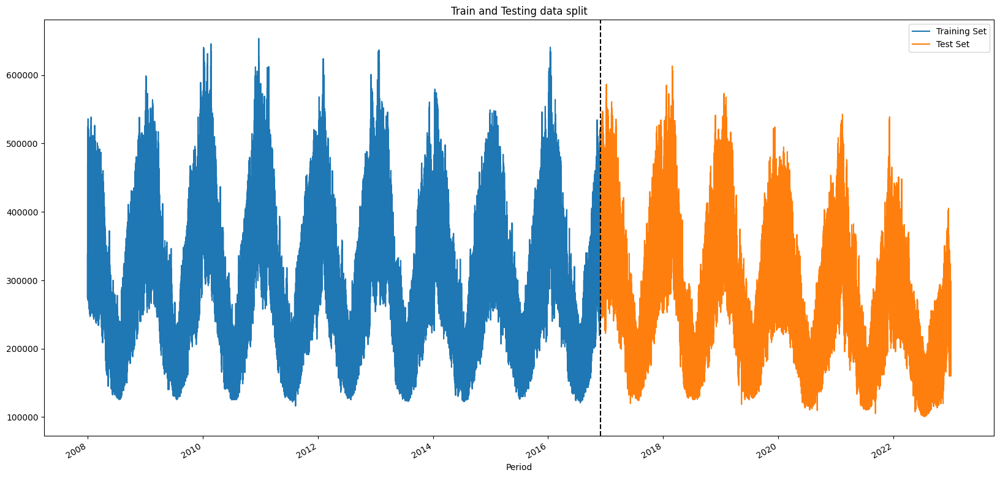

In [19]:
# Train and Testing data split
train = time_block.loc[time_block.index < "12-01-2016"] # all data before 1 sept 2008 is chosen for training
test = time_block.loc[time_block.index >= "12-01-2016"] # all the data after 1 sept 2008 will be used for testing the trained data
fig, ax = plt.subplots(figsize=(20, 10))
train.plot(ax=ax, label="Training Data Set", title="Train and Testing data split")
test.plot(ax=ax, label="Testing Set")
ax.axvline("12-01-2016", color="black", ls="--")
ax.legend(["Training Set", "Test Set"])
plt.show()

In [20]:
def create_features(df):
    ''' 
    The purpose of this method is to obtain the hour, day of week, quarter, month, year, day of year, day of month and week of the year from the date time format of the index of the dataframe
    '''
    df = df.copy()
    df["hour"] = df.index.hour
    df["dayofweek"] = df.index.dayofweek
    df["quarter"] = df.index.quarter
    df["month"] = df.index.month
    df["year"] = df.index.year
    df["dayofyear"] = df.index.dayofyear
    df["dayofmonth"] = df.index.day
    df["weekofyear"] = df.index.isocalendar().week
    return df


time_block = create_features(time_block)

In [21]:
time_block

,Värde (kWh),hour,dayofweek,quarter,month,year,dayofyear,dayofmonth,weekofyear
Period,,,,,,,,,
2008-01-01 00:00:00,337720.000,0,1,1,1,2008,1,1,1
2008-01-01 01:00:00,321910.000,1,1,1,1,2008,1,1,1
2008-01-01 02:00:00,306010.000,2,1,1,1,2008,1,1,1
2008-01-01 03:00:00,290350.000,3,1,1,1,2008,1,1,1
2008-01-01 04:00:00,279590.000,4,1,1,1,2008,1,1,1
...,...,...,...,...,...,...,...,...,...
2022-12-31 19:00:00,268924.423,19,5,4,12,2022,365,31,52
2022-12-31 20:00:00,247771.706,20,5,4,12,2022,365,31,52
2022-12-31 21:00:00,231221.923,21,5,4,12,2022,365,31,52


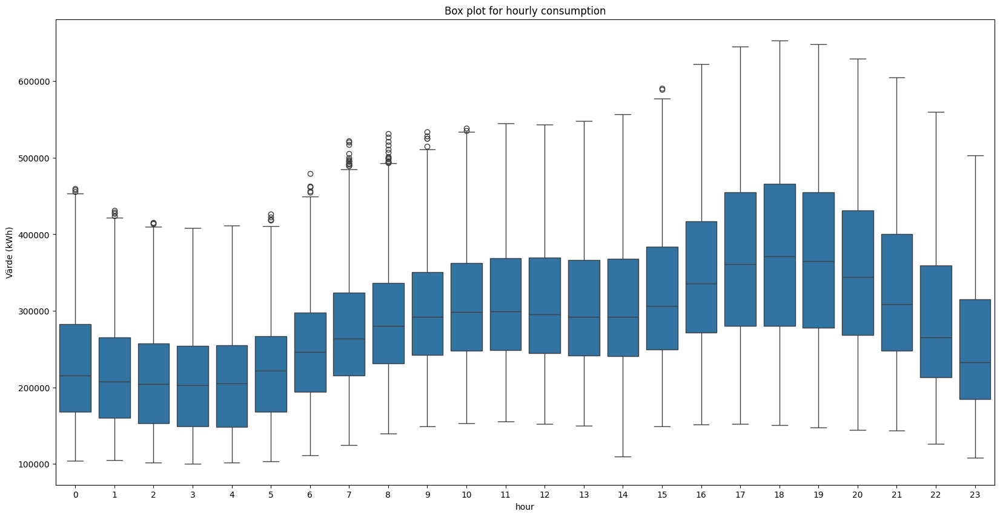

In [22]:
fig, ax = plt.subplots(figsize=(20, 10))
sns.boxplot(data=time_block, x="hour", y="Värde (kWh)")
ax.set_title("Box plot for hourly consumption")
plt.show()

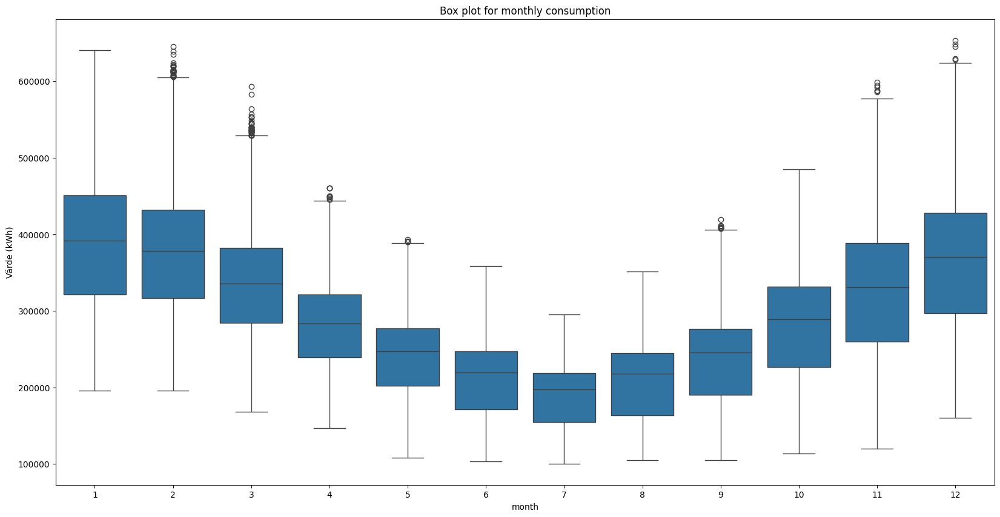

In [23]:
fig, ax = plt.subplots(figsize=(20, 10))
sns.boxplot(data=time_block, x="month", y="Värde (kWh)")
ax.set_title("Box plot for monthly consumption")
plt.show()

In [24]:
train = create_features(train)
test = create_features(test)

FEATURES = ["dayofyear", "hour", "dayofweek", "quarter", "month", "year"]
TARGET = "Värde (kWh)"

X_train = train[FEATURES]
y_train = train[TARGET]

X_test = test[FEATURES]
y_test = test[TARGET]

In [45]:
reg = xgb.XGBRegressor(base_score=350000, booster='gbtree',    
                       n_estimators=365,
                       early_stopping_rounds=100,
                       objective='reg:linear',
                       max_depth=4096,
                       learning_rate=0.875)
# reg.fit(X_train, y_train,
#         eval_set=[(X_train, y_train), (X_test, y_test)],
#         verbose=100)
# reg = xgb.XGBRegressor(base_score=331790, booster='gbtree',    
#                        n_estimators=10000000000,
#                        early_stopping_rounds=5,
#                        objective='reg:linear',
#                        max_depth=1000000000,
#                        learning_rate=0.875)
reg.fit(X_train, y_train,
        eval_set=[(X_train, y_train), (X_test, y_test)],
        verbose=100)

c:\Users\akash\AppData\Local\Programs\Python\Python311\Lib\site-packages\xgboost\core.py:160: UserWarning:

[01:24:12] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0750514818a16474a-1\xgboost\xgboost-ci-windows\src\objective\regression_obj.cu:209: reg:linear is now deprecated in favor of reg:squarederror.



[0]	validation_0-rmse:21203.34132	validation_1-rmse:53169.55837
[100]	validation_0-rmse:0.01032	validation_1-rmse:51806.77533
[101]	validation_0-rmse:0.01032	validation_1-rmse:51806.77531


XGBRegressor(base_score=350000, booster='gbtree', callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=None, device=None, early_stopping_rounds=100,
             enable_categorical=False, eval_metric=None, feature_types=None,
             gamma=None, grow_policy=None, importance_type=None,
             interaction_constraints=None, learning_rate=0.875, max_bin=None,
             max_cat_threshold=None, max_cat_to_onehot=None,
             max_delta_step=None, max_depth=4096, max_leaves=None,
             min_child_weight=None, missing=nan, monotone_constraints=None,
             multi_strategy=None, n_estimators=365, n_jobs=None,
             num_parallel_tree=None, objective='reg:linear', ...)

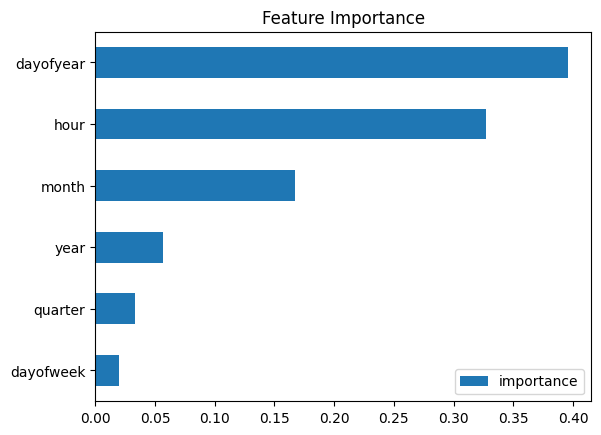

In [47]:
fi = pd.DataFrame(data=reg.feature_importances_,
             index=reg.feature_names_in_,
             columns=['importance'])
fi.sort_values('importance').plot(kind='barh', title='Feature Importance')
plt.show()

In [ ]:
''' 
This block of code should be implemented only if the block below has been implemented once and has to be inplemented again and thus
the prediction columns have to be dropped
'''
time_block = time_block.drop("prediction_x",axis=1)
time_block = time_block.drop("prediction_y",axis=1)
time_block = time_block.drop("prediction",axis=1)

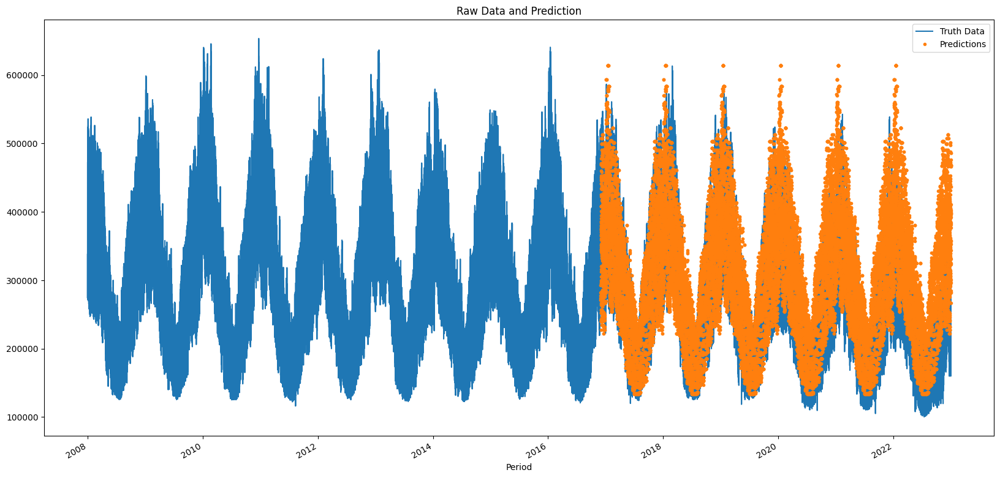

In [51]:
# time_block = time_block.drop("prediction_x",axis=1)
# time_block = time_block.drop("prediction_y",axis=1)
# time_block = time_block.drop("prediction",axis=1)
test["prediction"] = reg.predict(X_test)
time_block = time_block.merge(test[["prediction"]], how="left", left_index=True, right_index=True)
ax = time_block[["Värde (kWh)"]].plot(figsize=(20, 10))
time_block['prediction'].plot(ax=ax, style='.')
plt.legend(['Truth Data', 'Predictions'])
ax.set_title('Raw Data and Prediction')
plt.show()

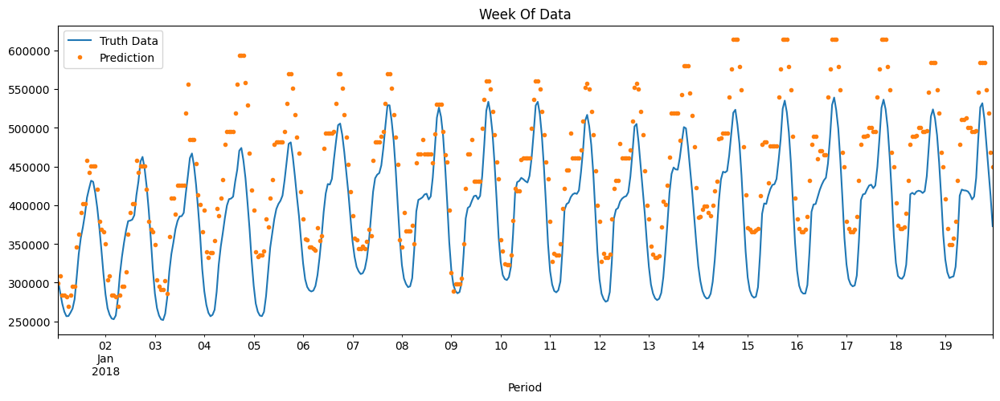

In [52]:
ax = time_block.loc[(time_block.index > '01-01-2018') & (time_block.index < '01-20-2018')]["Värde (kWh)"].plot(figsize=(15, 5), title='Week Of Data')
time_block.loc[(time_block.index > '01-01-2018') & (time_block.index < '01-20-2018')]['prediction'].plot(style='.')
plt.legend(['Truth Data','Prediction'])
plt.show()

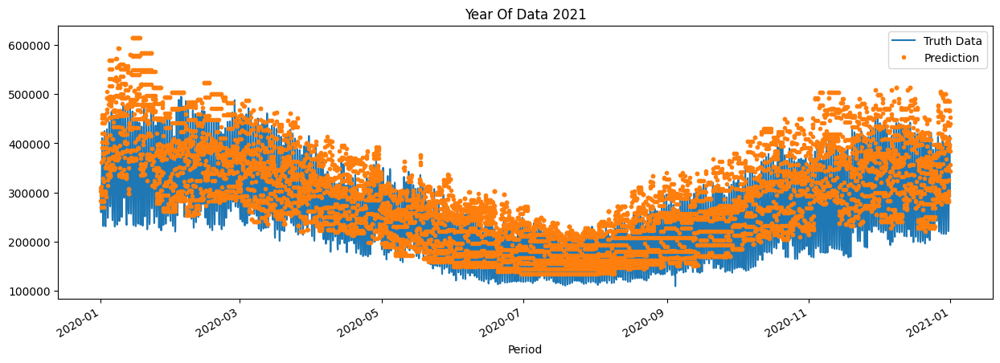

In [53]:
ax = time_block.loc[(time_block.index > '01-01-2020') & (time_block.index < '01-01-2021')]["Värde (kWh)"].plot(figsize=(15, 5), title='Year Of Data 2021')
time_block.loc[(time_block.index > '01-01-2020') & (time_block.index < '01-01-2021')]['prediction'].plot(style='.')
plt.legend(['Truth Data','Prediction'])
plt.show()

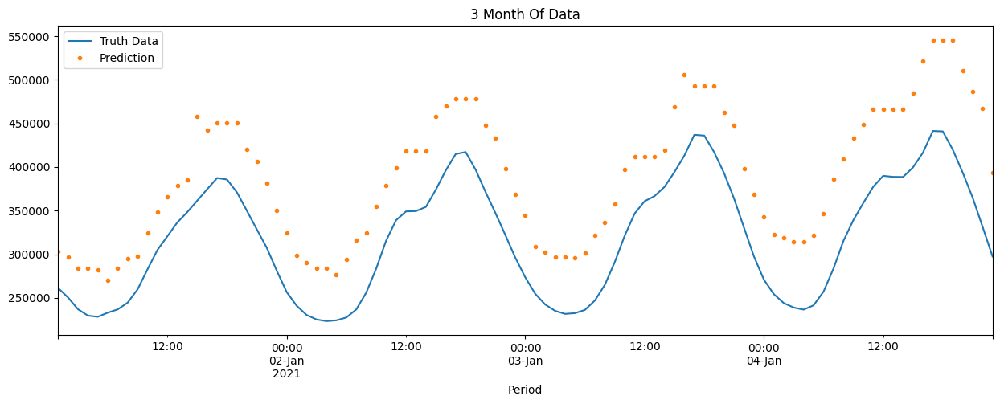

In [58]:
ax = time_block.loc[(time_block.index > '01-01-2021') & (time_block.index < '01-05-2021')]["Värde (kWh)"].plot(figsize=(15, 5), title='3 Month Of Data')
time_block.loc[(time_block.index > '01-01-2021') & (time_block.index < '01-05-2021')]['prediction'].plot(style='.')
plt.legend(['Truth Data','Prediction'])
plt.show()